# Validations

### Common Imports

In [1]:
import sys
import os

root_path = os.path.dirname(os.getcwd())
src_path = os.path.join(root_path, "src")
sys.path.insert(0, src_path)

%load_ext autoreload
%autoreload 2

import neptune.new as neptune
from neptune.new.types import File
NEPTUNE_TOKEN = "eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiJjZTkyYmJiYi0wN2E1LTRkY2YtOWU3Ny1kNjhjYmM3ZTVkNWEifQ=="
NEPTUNE_PROJECT = "cellarium/tissue-purifier"

# Helper functions

In [2]:
import matplotlib
from matplotlib import pyplot as plt
import seaborn
import scanpy
import pandas
from typing import Tuple, Any, List, Union
import numpy
import torch

### Download the checkpoints from Neptune

vae_ckpt

In [3]:
# run = neptune.init(
#         project='cellarium/tissue-purifier',
#         api_token=NEPTUNE_TOKEN,
#         run='TIS-1541',
#         mode="read-only")
# run["training/model/checkpoints/best_checkpoint-epoch=3399.ckpt"].download("ckpt_vae_tis_1541_epoch_3399.pt")
# run.stop()

dino ckpt

In [4]:
# run = neptune.init(
#         project='cellarium/tissue-purifier',
#         api_token=NEPTUNE_TOKEN,
#         run='TIS-1583',
#         mode="read-only")
# run["training/model/checkpoints/periodic_checkpoint-epoch=49.ckpt"].download("ckpt_dino_tis_1583_epoch_49.pt")
# run.stop()

### check that the files are downloaded

In [5]:
# ! ls -l ./ckpt*

### load the pretrained models

In [6]:
# from tissue_purifier.model_utils.dino import DinoModel
# from tissue_purifier.model_utils.vae import VaeModel
# 
# #vae_ckpt = "./ckpt_vae_tis_1453_epoch_2799.pt"
# vae_ckpt = "./ckpt_vae_tis_1541_epoch_3399.pt"
# #dino_ckpt = "./ckpt_dino_tis_1446_epoch_1288.pt"
# #dino_ckpt = "./ckpt_dino_tis_1446_epoch_199.pt"
# #dino_ckpt = "./ckpt_dino_tis_1443_epoch_1371.pt"
# #dino_ckpt = "./ckpt_dino_tis_1443_epoch_199.pt"
# #dino_ckpt = "./ckpt_dino_tis_1542_epoch_2086.pt"
# #dino_ckpt = "./ckpt_dino_tis_1542_epoch_2415.pt"
# dino_ckpt = "./ckpt_dino_tis_1583_epoch_49.pt"
# 
# dino = DinoModel.load_from_checkpoint(checkpoint_path=dino_ckpt, strict=False)
# vae = VaeModel.load_from_checkpoint(checkpoint_path=vae_ckpt, strict=False)

### read off the configuration which was used to create the model and dataset

In [7]:
# config_dino = dino._hparams
# config_vae = vae._hparams

### Compare the VAE and DINO configurations


In [8]:
# key_vae = set(config_vae.keys())
# key_dino = set(config_dino.keys())

# key_common = key_vae.intersection(key_dino)
# key_vae_only = key_vae - key_common
# key_dino_only = key_dino - key_common

# print("-----------")
# print("DINO vs VAE")
# print("-----------")
# for k in key_common:
#     print(k, "----->", config_dino[k]," vs ",config_vae[k])

# print("---------")
# print("DINO ONLY")
# print("---------")
# for k in key_dino_only:
#     print(k, " dino -> ", config_dino[k])

# print("---------")
# print("VAE ONLY")
# print("---------")
# for k in key_vae_only:
#     print(k, " dino -> ", config_vae[k])
# config_dino

### Modify the config so that (for evaluation purposes) I load the count matrix

In [9]:
# config_for_validation = config_dino.copy()
# config_for_validation["n_crops_for_tissue_test"] = 1  # I am going to create the crops on the fly
# config_for_validation["n_crops_for_tissue_train"] = 1  # I do not need multiple images
# config_for_validation["load_count_matrix"] = True
# config_for_validation["batch_size_per_gpu"] = 32 

In [10]:
# from tissue_purifier.data_utils.datamodule import SlideSeqTestisDM, SlideSeqKidneyDM    

# if config_for_validation["dataset"] == 'slide_seq_testis':
#     DM = SlideSeqTestisDM
# elif config_for_validation["dataset"] == "slide_seq_kidney":
#     DM = SlideSeqKidneyDM    
# else:
#     raise Exception()

# dm = DM(**config_for_validation)
# dm.prepare_data()
# dm.setup(stage=None)

### Extract the full size images from the traindata

In [11]:
# train_loader = dm.train_dataloader()
# train_dataset = train_loader.dataset
# sp_images = train_dataset.imgs
# metadatas = train_dataset.metadatas

save/load stuff 

In [12]:
# torch.save((train_dataset.imgs, train_dataset.metadatas), "./sp_images_valut.pt")
sp_images, metadatas = torch.load("./sp_images_valut.pt", map_location=torch.device('cpu'))

In [13]:
f_names = [meta.f_name for meta in metadatas]
cell_to_code_dict = sp_images[0]._categories_to_codes
cell_types = list(cell_to_code_dict.keys())

print()
print("metadatas -->", metadatas)
print()
print("tissue_names -->",f_names)
print()
print("cell_types ---->", cell_types)


metadatas --> [MetadataCropperDataset(f_name='wt1', loc_x=0.0, loc_y=0.0, moran=-99.9), MetadataCropperDataset(f_name='wt2', loc_x=0.0, loc_y=0.0, moran=-99.9), MetadataCropperDataset(f_name='wt3', loc_x=0.0, loc_y=0.0, moran=-99.9), MetadataCropperDataset(f_name='dis1', loc_x=0.0, loc_y=0.0, moran=-99.9), MetadataCropperDataset(f_name='dis2', loc_x=0.0, loc_y=0.0, moran=-99.9), MetadataCropperDataset(f_name='dis3', loc_x=0.0, loc_y=0.0, moran=-99.9)]

tissue_names --> ['wt1', 'wt2', 'wt3', 'dis1', 'dis2', 'dis3']

cell_types ----> ['ES', 'Endothelial', 'Leydig', 'Macrophage', 'Myoid', 'RS', 'SPC', 'SPG', 'Sertoli']


### Visualize one image as a check

In [14]:
from tissue_purifier.data_utils.transforms import *
from tissue_purifier.plot_utils.plot_images import show_raw_all_channels, show_raw_one_channel

# dense_and_raster =torchvision.transforms.Compose([SparseToDense(), Rasterize(sigma=dm.rasterize_sigma, normalize=False)])
# dense_img = dense_and_raster(sp_images[0].data)

In [15]:
# fig_all_channel = show_raw_all_channels(dense_img, legend_colorbar=cell_types, figsize=(12,12), titles=["One full image"])
# fig_all_channel

In [16]:
# fig_one_channel = show_raw_one_channel(dense_img, cmap='gray', n_col=3, figsize=(10,10), titles=cell_types)
# fig_one_channel 

### See the content of the sparse_image

In [17]:
# vars(sp_images[0])

### Check the anndata object associated with the image

In [18]:
# adata = sp_images[0].anndata
# adata

In [19]:
# adata.var

In [20]:
# adata.obs

In [21]:
# adata.X

# 0. Start neptune expoeriment for logging

In [22]:
logging_mode = "offline" # "async" # "offline" # or "async"
run: neptune.run.Run = neptune.init(project=NEPTUNE_PROJECT,
                                    api_token=NEPTUNE_TOKEN,
                                    mode=logging_mode,
                                    tags=["validation_testis_dataset", "v0"])

Info (NVML): NVML Shared Library Not Found. GPU usage metrics may not be reported. For more information, see https://docs-legacy.neptune.ai/logging-and-managing-experiment-results/logging-experiment-data.html#hardware-consumption 


offline/c4fce78b-2b67-4d92-b8e6-3c23d6a6919f
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api-reference/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


# 1. Create the dictionary with all the patches

## a. Analyze sparse images by tiling them with patches

In [23]:
# from tissue_purifier.misc_utils.dict_util import inspect_dict
# from tissue_purifier.model_utils.analyzer import SpatialAutocorrelation, Composition

# for sp_img in sp_images:
#     sp_img.clear_all()

In [24]:
# # These first set of analyzer work on images. Note that transform is NOT none
# analyzers = [
#     vae.cuda(),
#     dino.cuda()]

# feature_names= [
#     "feature_vae",
#     "feature_dino"]

# N_patches_max = 600 # start small for debugging purpose

# print("I am going to apply this transform --->")
# print(dm.trsfm_test)

# for sp_img, f_name in zip(sp_images, f_names):
#     sp_img.analyze_with_tiling(
#         cropper=dm.cropper_test,
#         transform=dm.trsfm_test,  # makes dense_imgs from sparse_imgs
#         patch_analyzers=analyzers,
#         feature_names=feature_names,
#         batch_size=64,
#         n_patches_max=N_patches_max,
#         overwrite=True,
#         store_crops=True,
#         store_crops_key="patches")
    
#     sp_img.patch_properties_dict['classify_tissue_label'] = [f_name] * N_patches_max

In [25]:
# # These second set of analyzer work on sparse tensor. Note that transform is NONE.
# analyzers = [
#     Composition(return_fraction=True), 
#     Composition(return_fraction=False),
#     SpatialAutocorrelation(modality='moran', n_neighbours=6, neigh_correct=True)]

# feature_names= [
#     "feature_composition", 
#     "feature_cell_number",
#     "moran_I"]

# for sp_img, f_name in zip(sp_images, f_names):
#     sp_img.analyze_with_tiling(
#         cropper=dm.cropper_test,
#         transform=None,
#         patch_analyzers=analyzers,
#         feature_names=feature_names,
#         batch_size=64,
#         n_patches_max=N_patches_max,
#         overwrite=True)    

save/load the embeddings for later

In [26]:
# torch.save((sp_images, metadatas), "./sp_images_valut.pt")

In [27]:
sp_images, metadatas = torch.load("./sp_images_valut.pt", map_location=torch.device('cpu'))

## b. Concatenate the embeddings from all the images

In [28]:
from tissue_purifier.misc_utils.dict_util import concatenate_list_of_dict, inspect_dict

list_of_dict = [sp_img.patch_properties_dict for sp_img in sp_images]
all_features_dict = concatenate_list_of_dict(list_of_dict)
inspect_dict(all_features_dict)

 feature_vae <class 'torch.Tensor'> torch.Size([3600, 1024]) cpu
 feature_dino <class 'torch.Tensor'> torch.Size([3600, 128]) cpu
 patches <class 'torch.Tensor'> torch.Size([3600, 9, 96, 96]) cpu
 patch_xywh <class 'torch.Tensor'> torch.Size([3600, 4]) cpu
 classify_tissue_label <class 'list'> 3600
 feature_composition <class 'torch.Tensor'> torch.Size([3600, 9]) cpu
 feature_cell_number <class 'torch.Tensor'> torch.Size([3600, 9]) cpu
 moran_I <class 'torch.Tensor'> torch.Size([3600, 9]) cpu


## c. Add few more quantities to the dict

In [29]:
all_features_dict['regress_moran'] = torch.max(all_features_dict['moran_I'], dim=-1)[0]
all_features_dict['classify_condition'] = ['wt' if label.startswith('wt') else 'dis' for label in all_features_dict['classify_tissue_label']]

for n, cell in enumerate(cell_types):
    all_features_dict['proportion_'+str(cell)+'_cell'] = all_features_dict['feature_composition'][:, n]

inspect_dict(all_features_dict)

 feature_vae <class 'torch.Tensor'> torch.Size([3600, 1024]) cpu
 feature_dino <class 'torch.Tensor'> torch.Size([3600, 128]) cpu
 patches <class 'torch.Tensor'> torch.Size([3600, 9, 96, 96]) cpu
 patch_xywh <class 'torch.Tensor'> torch.Size([3600, 4]) cpu
 classify_tissue_label <class 'list'> 3600
 feature_composition <class 'torch.Tensor'> torch.Size([3600, 9]) cpu
 feature_cell_number <class 'torch.Tensor'> torch.Size([3600, 9]) cpu
 moran_I <class 'torch.Tensor'> torch.Size([3600, 9]) cpu
 regress_moran <class 'torch.Tensor'> torch.Size([3600]) cpu
 classify_condition <class 'list'> 3600
 proportion_ES_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_Endothelial_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_Leydig_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_Macrophage_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_Myoid_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_RS_cell <class 'torch.Tensor'> torc

## d. Check stored crops

torch.Size([9, 9, 96, 96])


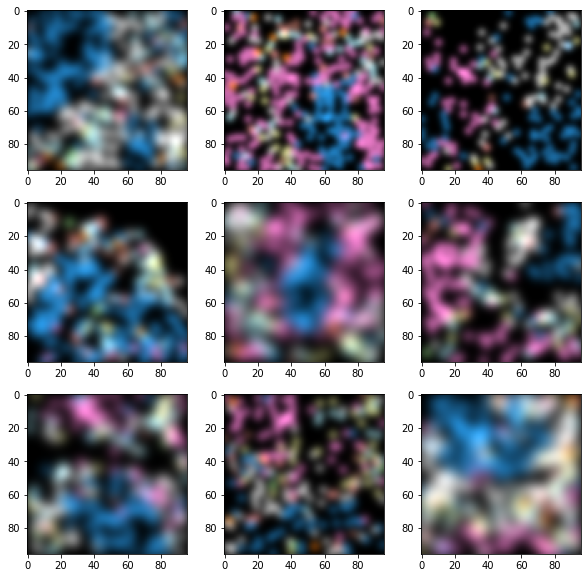

In [30]:
crops = all_features_dict["patches"][:9]
print(crops.shape)
fig_all_channel = show_raw_all_channels(crops, cmap='tab20', n_col=3, figsize=(10,10))
run["check/crops"].log(File.as_image(fig_all_channel))
fig_all_channel 

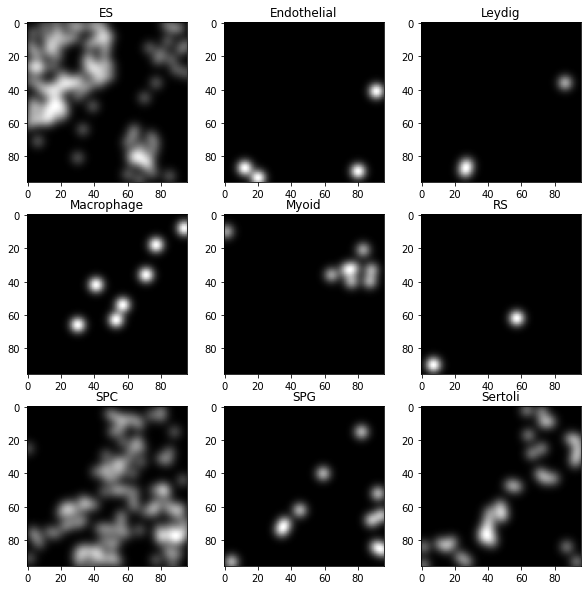

In [31]:
fig_one_channel = show_raw_one_channel(crops[0], cmap='gray', n_col=3, figsize=(10,10), titles=cell_types)
run["check/crops"].log(File.as_image(fig_one_channel))
fig_one_channel 

# 2. Show the knn images

In [32]:
from tissue_purifier.plot_utils.plot_knn import plot_knn_examples
from tissue_purifier.misc_utils.dict_util import subset_dict_non_overlapping_patches

## a. all patches

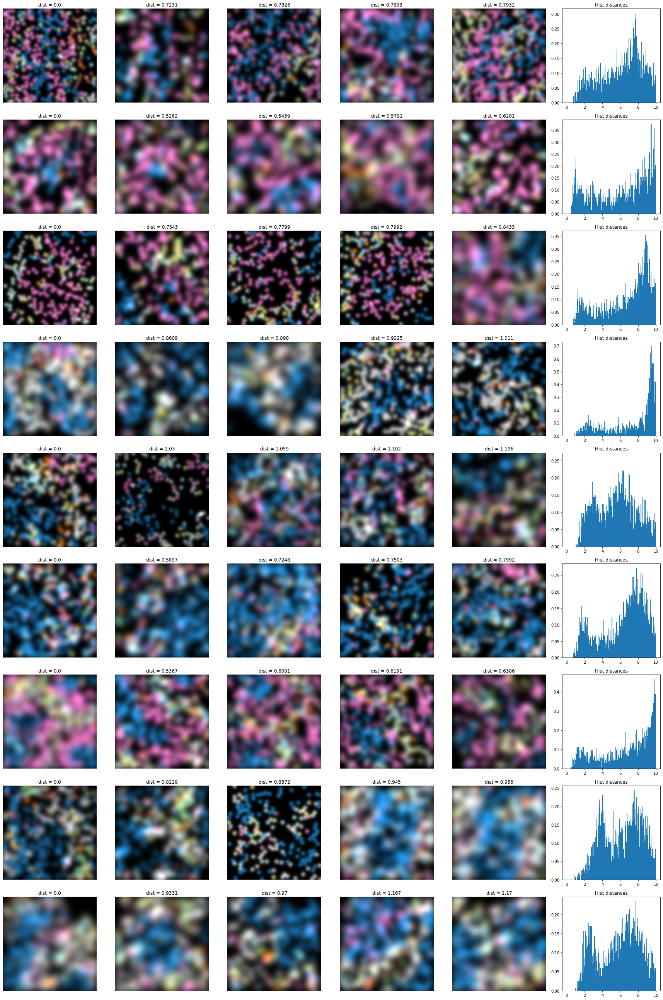

In [33]:
fig = plot_knn_examples(
    all_features_dict,
    embedding_key='feature_dino',
    image_key='patches',
    n_neighbors=5,
    examples=9,
    cmap='tab20',
    plot_histogram=True,
    bins=200,
    density=True,
    max_distance=10,
) 
run["knn_examples/all"].log(File.as_image(fig))
fig

## b. restrict to non-overlapping patches

In [34]:
subset_dict = subset_dict_non_overlapping_patches(
    input_dict=all_features_dict,
    key_tissue='classify_tissue_label',
    key_patch_xywh="patch_xywh",
    iom_threshold=0.0)

inspect_dict(subset_dict)

 feature_vae <class 'torch.Tensor'> torch.Size([301, 1024]) cpu
 feature_dino <class 'torch.Tensor'> torch.Size([301, 128]) cpu
 patches <class 'torch.Tensor'> torch.Size([301, 9, 96, 96]) cpu
 patch_xywh <class 'torch.Tensor'> torch.Size([301, 4]) cpu
 classify_tissue_label <class 'list'> 301
 feature_composition <class 'torch.Tensor'> torch.Size([301, 9]) cpu
 feature_cell_number <class 'torch.Tensor'> torch.Size([301, 9]) cpu
 moran_I <class 'torch.Tensor'> torch.Size([301, 9]) cpu
 regress_moran <class 'torch.Tensor'> torch.Size([301]) cpu
 classify_condition <class 'list'> 301
 proportion_ES_cell <class 'torch.Tensor'> torch.Size([301]) cpu
 proportion_Endothelial_cell <class 'torch.Tensor'> torch.Size([301]) cpu
 proportion_Leydig_cell <class 'torch.Tensor'> torch.Size([301]) cpu
 proportion_Macrophage_cell <class 'torch.Tensor'> torch.Size([301]) cpu
 proportion_Myoid_cell <class 'torch.Tensor'> torch.Size([301]) cpu
 proportion_RS_cell <class 'torch.Tensor'> torch.Size([301]) c

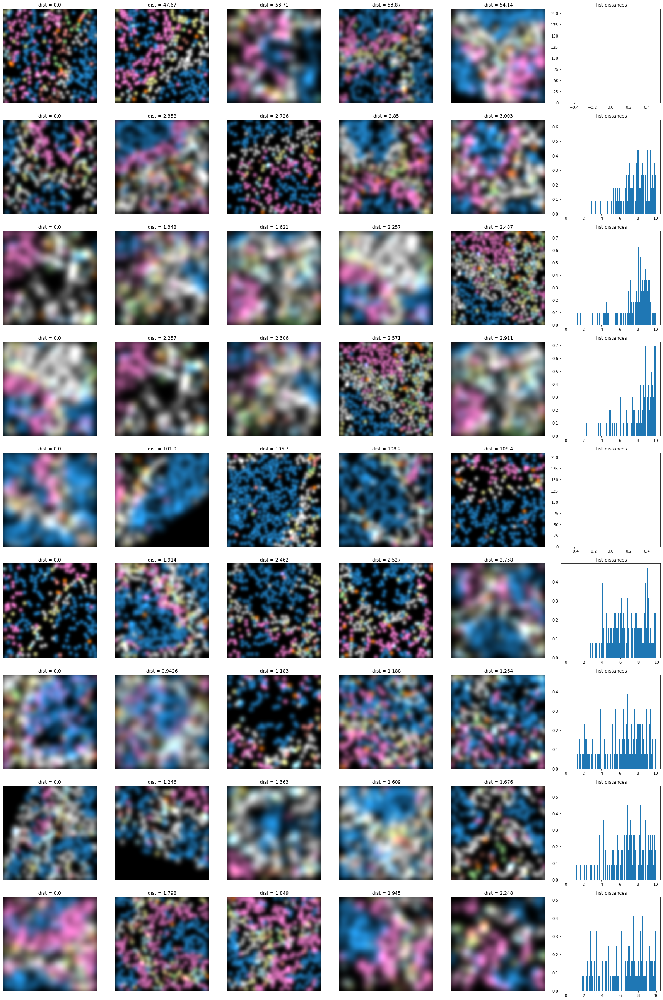

In [35]:
fig = plot_knn_examples(
    subset_dict,
    embedding_key='feature_dino',
    image_key='patches',
    n_neighbors=5,
    examples=9,
    cmap='tab20',
    plot_histogram=True,
    bins=200,
    density=True,
    max_distance=10,
) 
run["knn_examples/non_overlapping"].log(File.as_image(fig))
fig

# 3. Embeddings can predict the annotations

In [36]:
from tissue_purifier.model_utils.classify_regress import classify_and_regress, PlClassifier, PlRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from tissue_purifier.misc_utils.dict_util import flatten_dict
import pandas
import seaborn as sns

inspect_dict(all_features_dict)

regress_keys, feature_keys, classify_keys, proportion_keys = [], [], [], []
for key in all_features_dict.keys():
    if key.startswith("feature"):
        feature_keys.append(key)
    elif key.startswith("regress"): 
        regress_keys.append(key)
    elif key.startswith("classify"):
        classify_keys.append(key)
    elif key.startswith("proportion"):
        proportion_keys.append(key)
        
annotation_keys = regress_keys + classify_keys + proportion_keys
annotation_keys_slimmed = regress_keys + classify_keys
        
print(regress_keys)
print(classify_keys)
print(feature_keys)
print(annotation_keys)
print(annotation_keys_slimmed)

 feature_vae <class 'torch.Tensor'> torch.Size([3600, 1024]) cpu
 feature_dino <class 'torch.Tensor'> torch.Size([3600, 128]) cpu
 patches <class 'torch.Tensor'> torch.Size([3600, 9, 96, 96]) cpu
 patch_xywh <class 'torch.Tensor'> torch.Size([3600, 4]) cpu
 classify_tissue_label <class 'list'> 3600
 feature_composition <class 'torch.Tensor'> torch.Size([3600, 9]) cpu
 feature_cell_number <class 'torch.Tensor'> torch.Size([3600, 9]) cpu
 moran_I <class 'torch.Tensor'> torch.Size([3600, 9]) cpu
 regress_moran <class 'torch.Tensor'> torch.Size([3600]) cpu
 classify_condition <class 'list'> 3600
 proportion_ES_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_Endothelial_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_Leydig_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_Macrophage_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_Myoid_cell <class 'torch.Tensor'> torch.Size([3600]) cpu
 proportion_RS_cell <class 'torch.Tensor'> torc

### a. KNN classification/regression on set of non-overlapping patches

In [37]:
def exclude_self(d):
    w = numpy.ones_like(d)
    w[d==0.0] = 0.0
    return w
    
kn_kargs = {
    "n_neighbors": 5,
    "weights": exclude_self,
}

regressor = KNeighborsRegressor(**kn_kargs)
classifier = KNeighborsClassifier(**kn_kargs)

# loop over subset made of not-overlapping patches
df_tot = None
for n in range(25):

    # create a dictionary with only non-overlapping patches to test kn-regressor/classifier
    all_features_dict_subset = subset_dict_non_overlapping_patches(
        input_dict=all_features_dict,
        key_tissue="classify_tissue_label",
        key_patch_xywh="patch_xywh",
        iom_threshold=0.1)

    df_tmp = classify_and_regress(
        input_dict=all_features_dict_subset,
        feature_keys=feature_keys,
        regress_keys=regress_keys+proportion_keys,
        classify_keys=classify_keys,
        regressor=regressor,
        classifier=classifier,
        n_splits=1,
        n_repeats=1,
        verbose=False,
    )
    df_tot = df_tmp if df_tot is None else df_tot.merge(df_tmp, how='outer')

plot the quantities which are not related to regression

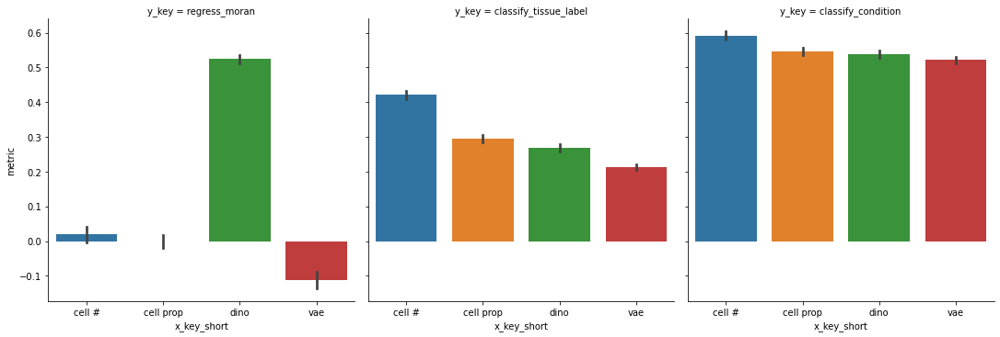

In [38]:
filt1 = (df_tot["accuracy"].isnull())
df_tmp = df_tot.loc[~filt1]
df_no_nan1 = df_tmp.copy()
del df_no_nan1["r2"]
df_no_nan1.rename(columns = {'accuracy':'metric'}, inplace = True)

filt2 = (df_tot["r2"].isnull())
df_tmp = df_tot.loc[~filt2]
df_no_nan2 = df_tmp.copy()
del df_no_nan2["accuracy"]
df_no_nan2.rename(columns = {'r2':'metric'}, inplace = True)

df_no_nan = df_no_nan1.merge(df_no_nan2, how='outer')
df_no_nan = df_no_nan.sort_values(by="x_key")  

short_names = {
    "feature_vae": 'vae',
    "feature_dino": 'dino',
    "feature_cell_number": 'cell #',
    "feature_composition": 'cell prop'
}
df_no_nan["x_key_short"] = df_no_nan["x_key"].apply(lambda x: short_names[x])

filt = df_no_nan["y_key"].apply(lambda x: x.startswith("prop"))
g = seaborn.catplot(y="metric", x="x_key_short", col="y_key", col_wrap=3, data=df_no_nan.loc[~filt], legend=True, kind='bar')
run["embeddings/knn"].log(File.as_image(g._fig))

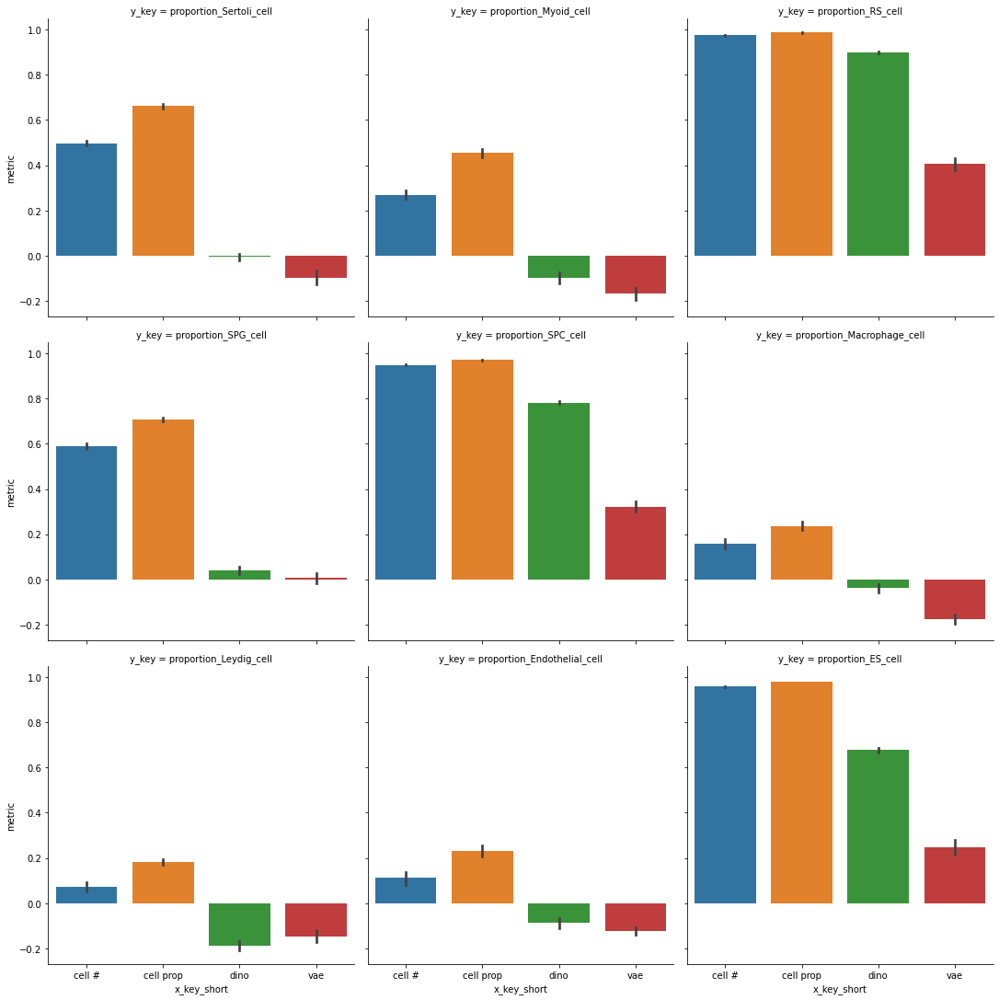

In [39]:
g = seaborn.catplot(y="metric", x="x_key_short", col="y_key", col_wrap=3, data=df_no_nan.loc[filt], legend=True, kind='bar')
run["embeddings/knn"].log(File.as_image(g._fig))

### b. MLP classification/regression

In [40]:
# pl_kargs = {
#     "hidden_dims": [100],
#     "max_iter": 1000,
# }
# 
# classifier_pl = PlClassifier(**pl_kargs)
# regressor_pl = PlRegressor(**pl_kargs)
# 
# 
# df_tot = classify_and_regress(
#     input_dict=all_features_dict,
#     feature_keys=feature_keys,
#     regress_keys=regress_keys+proportion_keys,
#     classify_keys=classify_keys,
#     regressor=regressor,
#     classifier=classifier,
#     n_splits=5,
#     n_repeats=2,
#     verbose=False,
# )

plot the quantities related to regression

In [41]:
# filt1 = (df_tot["accuracy"].isnull())
# df_tmp = df_tot.loc[~filt1]
# df_no_nan1 = df_tmp.copy()
# del df_no_nan1["r2"]
# df_no_nan1.rename(columns = {'accuracy':'metric'}, inplace = True)
# 
# filt2 = (df_tot["r2"].isnull())
# df_tmp = df_tot.loc[~filt2]
# df_no_nan2 = df_tmp.copy()
# del df_no_nan2["accuracy"]
# df_no_nan2.rename(columns = {'r2':'metric'}, inplace = True)
# 
# df_no_nan = df_no_nan1.merge(df_no_nan2, how='outer')
# df_no_nan = df_no_nan.sort_values(by="x_key")  
# 
# short_names = {
#     "feature_vae": 'vae',
#     "feature_dino": 'dino',
#     "feature_cell_number": 'cell #',
#     "feature_composition": 'cell prop'
# }
# df_no_nan["x_key_short"] = df_no_nan["x_key"].apply(lambda x: short_names[x])
# 
# filt = df_no_nan["y_key"].apply(lambda x: x.startswith("prop"))
# g = seaborn.catplot(y="metric", x="x_key_short", col="y_key", col_wrap=3, data=df_no_nan.loc[~filt], legend=True, kind='bar')
# run["embeddings/mlp"].log(File.as_image(g._fig))

In [42]:
# g = seaborn.catplot(y="metric", x="x_key_short", col="y_key", col_wrap=3, data=df_no_nan.loc[filt], legend=True, kind='bar')
# run["embeddings/mlp"].log(File.as_image(g._fig))

### c. show just DINO and scatter plot

In [43]:
from sklearn.model_selection import train_test_split

X_dino = all_features_dict["feature_dino"]

yp = all_features_dict["regress_moran"].detach().numpy()
yc1 = numpy.array(all_features_dict["classify_condition"])
yc2 = numpy.array(all_features_dict["classify_tissue_label"])

X_train, X_test, yp_train, yp_test, yc1_train, yc1_test, yc2_train, yc2_test = train_test_split(X_dino, yp, yc1, yc2, 
                                                                                                 test_size=0.2, 
                                                                                                 random_state=42, 
                                                                                                 stratify=yc2)

In [51]:
pl_kargs = {
    "hidden_dims": [100],
    "max_iter": 2,
}

classifier_pl = PlClassifier(**pl_kargs)
regressor_pl = PlRegressor(**pl_kargs)

regressor_pl.fit(X_train, yp_train)
yp_pred = regressor_pl.predict(X_test)
classifier_pl.fit(X_train, yc1_train)
yc1_pred = classifier_pl.predict(X_test)
classifier_pl.fit(X_train, yc2_train)
yc2_pred = classifier_pl.predict(X_test)

dict_tmp_p = {'what': ["moran"] * len(yp_pred), 'true': yp_test, 'pred': yp_pred}
dict_tmp_c1 = {'what': ["condition"] * len(yc1_pred), 'true': yc1_test, 'pred': yc1_pred}
dict_tmp_c2 = {'what': ["tissue"] * len(yc2_pred), 'true': yc2_test, 'pred': yc2_pred}
df_p = pandas.DataFrame(dict_tmp_p)
df_c1 = pandas.DataFrame(dict_tmp_c1)
df_c2 = pandas.DataFrame(dict_tmp_c2)

fig, axes = 

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | criterium | MSELoss    | 0     
1 | net       | Sequential | 13.0 K
-----------------------------------------
13.0 K    Trainable params
0         Non-trainable params
13.0 K    Total params
0.052     Total estimated model params size (MB)
/Users/ldalessi/anaconda3/envs/pyro/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:110: UserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type             | Params
-----------------------------------------------
0 | criterium | CrossEntropyLoss | 0     
1 | net       | Sequential       | 13.1 K
-----------------------------------------------
13.1 K    Trainable params
0         Non-trainable params
13.1 K    Total params
0.052     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type             | Params
-----------------------------------------------
0 | criterium | CrossEntropyLoss | 0     
1 | net       | Sequential       | 13.5 K
-----------------------------------------------
13.5 K    Trainable params
0         Non-trainable params
13.5 K    Total params
0.054     Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

In [53]:
df_c1

,what,true,pred
0,condition,wt,wt
1,condition,wt,wt
2,condition,wt,wt
3,condition,wt,dis
4,condition,wt,dis
...,...,...,...
715,condition,dis,dis
716,condition,dis,wt
717,condition,wt,dis
718,condition,wt,wt


In [52]:
df_p

,what,true,pred
0,moran,0.546338,0.305221
1,moran,0.361783,0.180215
2,moran,0.605148,0.280278
3,moran,0.468031,0.401269
4,moran,0.389448,0.134676
...,...,...,...
715,moran,0.402477,0.273119
716,moran,0.370998,0.127829
717,moran,0.348766,0.084450
718,moran,0.700731,1.043738


In [50]:
df_dinoa

,what,true,pred
0,moran,0.546338,0.406836
1,moran,0.361783,0.37215
2,moran,0.605148,0.214309
3,moran,0.468031,0.205924
4,moran,0.389448,0.194932
...,...,...,...
717,moran,0.348766,0.197779
718,moran,0.700731,0.361449
719,moran,0.452359,0.138321
720,"[condition, condition, condition, condition, c...","[wt, wt, wt, wt, wt, dis, dis, dis, wt, wt, wt...","[wt, wt, wt, wt, dis, dis, wt, wt, dis, wt, wt..."


In [ ]:
assert 1==2

In [ ]:
classifier_pl.fit(X_train, yc1_train)
yc1_pred = classifier_pl.predict(X_test)
classifier_pl.fit(X_train, yc2_train)
yc2_pred = classifier_pl.predict(X_test)

In [ ]:
ax = sns.regplot(x="true", y="pred", data=df_dino)

In [ ]:
plt.scatter(y_test[:, 0].cpu().numpy(), y_pred.detach().cpu().numpy())



regressor_mlp.fit(X, y)
regressor_kn.fit(X, y)

In [ ]:
inspect_dict(all_features_dict)

In [ ]:
df_tot

In [ ]:
mlp_kargs = {
}

classifier = PlClassifier(**mlp_kargs)
regressor = PlRegressor(**mlp_kargs)


df_tot = classify_and_regress(
    input_dict=all_features_dict_subset,
    feature_keys=feature_keys,
    regress_keys=regress_keys+proportion_keys,
    classify_keys=classify_keys,
    regressor=regressor,
    classifier=classifier,
    n_splits=2,
    n_repeats=1,
    verbose=True
)           

from here. Use both knn and mlp classifier and regressor.

In [ ]:
df

# 3. Show the pcas/umaps of embeddings with annotations

In [ ]:
from tissue_purifier.misc_utils.misc import SmartPca, SmartUmap, SmartLeiden, SmartScaler
from tissue_purifier.plot_utils.plot_misc import plot_cdf_pdf
from tissue_purifier.plot_utils.plot_embeddings import plot_embeddings

smart_scaler = SmartScaler(quantiles=[0.01, 0.99], clamp=True) 
smart_pca = SmartPca(preprocess_strategy='raw')
smart_umap = SmartUmap(n_neighbors=25, preprocess_strategy='raw', n_components=2, min_dist=0.5, metric='euclidean', 
                       compute_all_pairwise_distances=False)

all_figs_explained_variance = []

for k in ["feature_dino", "feature_vae", "feature_composition"]:
    
    embeddings_raw = all_features_dict[k].clone()

    if k.endswith("composition"):    
        embeddings_pca = smart_pca.fit_transform(embeddings_raw, n_components=1.0)
        embeddings_umap = smart_umap.fit_transform(embeddings_pca)
    else:
        embeddings_clamped_scaled = smart_scaler.fit_transform(embeddings_raw)
        embeddings_pca = smart_pca.fit_transform(embeddings_clamped_scaled, n_components=0.9)
        embeddings_umap = smart_umap.fit_transform(embeddings_pca)

    all_features_dict["pca_"+k] = embeddings_pca
    all_features_dict["umap_"+k] = embeddings_umap
    all_features_dict["graph_umap"+k] = smart_umap.get_graph()    
    fig = plot_cdf_pdf(cdf_y=smart_pca._explained_variance, x_label="# of PCAs", sup_title=k)
    all_figs_explained_variance.append(fig)
    
for fig in all_figs_explained_variance:
    run["pca/explained_variance"].log(File.as_image(fig))

In [ ]:
all_figs_explained_variance[0]

In [ ]:
all_figs_explained_variance[1]

In [ ]:
all_figs_explained_variance[2]

In [ ]:
inspect_dict(all_features_dict)

In [ ]:
annotation_keys, embedding_umap_keys, embedding_pca_keys = [], [], []
for k in all_features_dict.keys():
    if k.startswith("classify") or k.startswith("regress") or k.startswith("proportion"):
        annotation_keys.append(k) 
    if k.startswith("umap"):
        embedding_umap_keys.append(k)
    elif k.startswith("pca"):
        embedding_pca_keys.append(k)
        
print("annotation_keys ->", annotation_keys)
print("embedding_umap_keys ->", embedding_umap_keys)
print("embedding_pca_keys ->", embedding_pca_keys)

In [ ]:
all_figs_umaps = []
for embedding_key in embedding_umap_keys:
    fig = plot_embeddings(
        all_features_dict,
        embedding_key=embedding_key,
        annotation_keys=annotation_keys,
        titles=annotation_keys,
        sup_title=embedding_key,
        size=5,
        n_col=4
    )
    all_figs_umaps.append(fig)
    run["umaps/annotations"].log(File.as_image(fig))
    
    
all_figs_pcas = []
for embedding_key in embedding_pca_keys:
    fig = plot_embeddings(
        all_features_dict,
        embedding_key=embedding_key,
        annotation_keys=annotation_keys,
        titles=annotation_keys,
        sup_title=embedding_key,
        size=5,
        n_col=4
    )
    all_figs_pcas.append(fig)
    run["pcas/annotations"].log(File.as_image(fig))

### a. Dino embeddings

In [ ]:
all_figs_pcas[0]

In [ ]:
all_figs_umaps[0]

### b. Vae embeddings

In [ ]:
all_figs_pcas[1]

In [ ]:
all_figs_umaps[1]

### c. Cell Proportions embeddings

In [ ]:
all_figs_pcas[2]

In [ ]:
all_figs_umaps[2]

# 4. Perform Leiden clustering (only for DINO)

In [ ]:
inspect_dict(all_features_dict)

In [ ]:
umap_graph = all_features_dict["graph_umapfeature_dino"]
smart_leiden = SmartLeiden(graph=umap_graph)

for res in [0.02, 0.05, 0.1, 0.2, 0.4]:
    leiden_clusters = smart_leiden.cluster(resolution=res, partition_type='RBC')
    all_features_dict["leiden_feature_dino_res_"+str(res)] = leiden_clusters
    all_features_dict["leiden_feature_dino_res_"+str(res)+"_one_hot"] = torch.nn.functional.one_hot(torch.from_numpy(leiden_clusters).long())  # need to make it one-hot so that I can average 

## a. visualize the the leiden clusters in UMAP

In [ ]:
leiden_keys = []
for key in all_features_dict.keys():
    if key.startswith("leiden") and not key.endswith("one_hot"):
        leiden_keys.append(key)
        
print(leiden_keys)

In [ ]:
titles, annotations = [], []
for key in leiden_keys:
    annotations.append(all_features_dict[key])
    titles.append(key)

fig = plot_embeddings(
    all_features_dict,
    embedding_key="umap_feature_dino",
    annotation_keys=leiden_keys,
    titles=titles,
    sup_title="dino features",
    size=5,
    n_col=3
)
fig

## b. characterize the clusters based on distribution of annotations

In [ ]:
from tissue_purifier.plot_utils.plot_misc import plot_clusters_annotations

figs_cluster_annotations = []
leiden_keys = ['leiden_feature_dino_res_0.4', 'leiden_feature_dino_res_0.05']

for leiden_key in leiden_keys: 
    
    fig = plot_clusters_annotations(
        input_dictionary=all_features_dict,
        cluster_key=leiden_key,
        annotation_keys=annotation_keys,
        titles=annotation_keys,
        sup_title=leiden_key)

    run["clusters/annotation"].log(File.as_image(fig))
    figs_cluster_annotations.append(fig)

In [ ]:
figs_cluster_annotations[0]

In [ ]:
figs_cluster_annotations[1]

## c. transfer the one_hot leiden annotations to the original sparse images

In [ ]:
from tissue_purifier.misc_utils.dict_util import transfer_annotations_between_dict
     
leiden_keys_one_hot = []
for key in all_features_dict.keys():
    if key.startswith("leiden") and key.endswith("one_hot"):
        leiden_keys_one_hot.append(key)
print("leiden_keys_one_hot")
        
anchor_key = "feature_dino"
    
for sp_img in sp_images:    
    transfer_annotations_between_dict(
        source_dict=all_features_dict,
        dest_dict=sp_img.patch_properties_dict,
        annotation_keys=leiden_keys_one_hot,
        anchor_key="feature_dino",
    )
    
    # Note that I use the one_hot version of the Leiden clusters to transfer the annotations
    sp_img.patch_property_to_image_property(
        keys_to_transfer=leiden_keys_one_hot,
        overwrite=True)

print()
print()
print("Check what is on the image_properties_dict")
inspect_dict(sp_images[0].image_properties_dict)

## d. visualize the clusters in real space

In [ ]:
import skimage
from tissue_purifier.misc_utils.misc import inverse_one_hot
from tissue_purifier.plot_utils.plot_images import show_batch, pad_and_crop_and_stack

def masked_cluster(rgbs, spatial_labels, k: int=0, equality: bool=True):
    """
    Args:
        rgbs: list of 3D tensors with possibly different widths and heights. 
            However the number of channels must be 3 for all tensor in the list.
        spatial_labels: list of 2D tensors with possibly different widths and heights.
        k: int, the cluster label to show
        equality: bool, if true show the cluster with label == k, if false show all the clusters with label != k.
        
    Returns:
        a list of masked tensors
    """
    assert isinstance(rgbs, list) and len(rgbs[0].shape) == 3, \
        "Error, rgbs must be a list of 3D tensors."
    
    assert isinstance(spatial_labels, list) and len(spatial_labels[0].shape) == 2, \
        "Error, spatial_labels must be a list be a list of 2D tensors."
    
    assert len(rgbs) == len(spatial_labels), \
        "Errors, len(rgbs) must be the same as len(spatial_labels). Received {0} and {1}".format(len(rgbs), len(spatial_labels))
    
    if equality:
        return [ rgb * (spatial_label == k) for rgb, spatial_label in zip(rgbs, spatial_labels)]
    else:
        return [ rgb * (spatial_label != k) for rgb, spatial_label in zip(rgbs, spatial_labels)]
    
    
key = "leiden_feature_dino_res_0.05_one_hot"

overlaids, spatial_labels, rgbs = [], [], []
for sp_img in sp_images:
    spatial_label = inverse_one_hot(sp_img.image_properties_dict[key])
    rgb = sp_img.to_rgb()
    overlaid = skimage.color.label2rgb(
        spatial_label.cpu().numpy(), 
        image=rgb.cpu().permute(1,2,0).numpy(), 
        alpha=0.3, 
        bg_label=-1, 
        image_alpha=1.0, 
        saturation=0.0)
    
    overlaids.append(overlaid)
    rgbs.append(rgb)
    spatial_labels.append(spatial_label)

In [ ]:
imgs = pad_and_crop_and_stack(rgbs)
show_batch(imgs, n_col=3, normalize_range=(0.0,1.5), figsize=(24, 36))

### I. for each image show a cluster and its complementary

In [ ]:
clusters_in_space_and_their_complementary = []
for k in range(5):
    masked_k_eq = masked_cluster(rgbs, spatial_labels, k=k, equality=True)
    imgs_k_eq = pad_and_crop_and_stack(masked_k_eq)
    masked_k_neq = masked_cluster(rgbs, spatial_labels, k=k, equality=False)
    imgs_k_neq = pad_and_crop_and_stack(masked_k_neq)
    tmp = torch.stack([imgs_k_eq, imgs_k_neq], dim=1).flatten(end_dim=-4)
    fig = show_batch(tmp, n_col=2, normalize_range=(0.0,1.5)) #, figsize=(24, 36))

    clusters_in_space_and_their_complementary.append(fig)
    run["cluster_in_space_and_their_opposite/"+str(k)].log(File.as_image(fig))

In [ ]:
clusters_in_space_and_their_complementary[0]

### II. Show the same cluster in space across all the tissue

In [ ]:
clusters_in_space_across_tissue = []
for k in range(5):
    masked = masked_cluster(rgbs, spatial_labels, k=1, equality=True)
    imgs_tmp = pad_and_crop_and_stack(masked)
    fig = show_batch(imgs_tmp, n_col=3, normalize_range=(0.0,1.5), figsize=(24, 36))
    clusters_in_space_across_tissue.append(fig)
    run["cluster_in_space/"+str(k)].log(File.as_image(fig))

In [ ]:
clusters_in_space_across_tissue[0]

In [ ]:
assert 1==2

FROM HERE

# IDEA
red cell in mask vs red cells in ~maks
nc cell types
k clusters

nc * k matrix similarity 

1.
n_trial = 100
pick cell type i
pick cluster k

delta_ik = 0
for i_trial in range(n_trial):
   pick three patches, two labeled as k (p, +), one labeled as not k (-)
   calculate total gene expression of cell type i in each patch and normalize <-- x^(p)_g, x^(+)_g, x^(-)_g
   calculate delta_ik += (cossim(x^(p)_g, x^(+)_g) - cossim(x^(p)_g, x^(-)_g))
delta_ik /= n_trial

If delta_ik is large for a certain ik and k is enriched in disease then i has role in disease.

3. 
I can do classification with noisy label to obtain disease label
Do as above but delta_ic where c is condition not cluster.
If delta_ic is large, then i has role in disease.


2.
for all beads in cluster k
compute the composition vector cv_{i,k} i=identity of central bead, k=cluster 
(average the composition vector of all macrophage in cluster 7)
same but compute composition vector of the neighbourhood (small nearest neighbour, 25).
(maybe aggregat
calculate delta_ik += (cossim(cv^(p), cv^(+)) - cossim(cv^(p), cv^(-)))

3.
one matrix for each cluter, size of matrix is cell_type by cell_type
count_occurances_of_cell_type_ij_beeing within 5 nearest neighbour of each other in a given cluster (properly normalize)
heat_maps
compare cluster specific heat maps vs cluster agnostic heat maps vs tissue heat_map

after you split the tissue do you get two half with lower/higher contact probabilities....

4. 
predict gene expression conditioned on cell type and cluster label vs predict gene expression conditioned on cell type only.
How much variance can you "explain away" by knowing the cluster label?

5. 
Mutual information between cluster_label, cell_type, gene_expression



In [ ]:
plt.imshow(rgb * (cluster_labels != 0)[..., None])

In [ ]:
plt.imshow(rgb * (cluster_labels == 1)[..., None])

In [ ]:
plt.imshow(rgb * (cluster_labels == 2)[..., None])

In [ ]:
plt.imshow(rgb * (cluster_labels == 3)[..., None])

In [ ]:
plt.imshow(rgb * (cluster_labels == 4)[..., None])

In [ ]:
2

In [ ]:
plt.imshow(cluster_labels)

In [ ]:
plt.imshow(overlaid)

In [ ]:
f_names

In [ ]:
n_col = 3
n_row = 2
fig, axes = plt.subplots(ncols=n_col, nrows=n_row, figsize=(12,12))
for n, (f_name, overlaid) in enumerate(zip(f_names, overlaids)):
    c = n % n_col
    r = n // n_col
    ax_curr = axes[r, c]
    _ = ax_curr.imshow(overlaid)
    ax_curr.set_title(f_name)
    
fig.tight_layout()
plt.close(fig)
fig


# FROM HERE

# Show some maps (Perform PCA, UMAP, Leiden on the learned features)

In [ ]:
from tissue_purifier.misc_utils.misc import SmartPca, SmartUmap, SmartLeiden

In [ ]:
feature_keys = ['feature_vae', 'feature_dino', 'feature_composition']

for key in feature_keys:
    
    if key == 'feature_composition':
        smart_pca = SmartPca(preprocess_strategy='z_score')
        smart_umap = SmartUmap(n_neighbors=25, preprocess_strategy='z_score', n_components=2, min_dist=0.5, metric='cosine')
        
        input_features = all_features_dict[key]
        embeddings_pca = smart_pca.fit_transform(input_features, n_components=0.9)
        embeddings_umap = smart_umap.fit_transform(input_features)
    else:
        smart_pca = SmartPca(preprocess_strategy='z_score')
        smart_umap = SmartUmap(n_neighbors=25, preprocess_strategy='raw', n_components=2, min_dist=0.5, metric='euclidean')
                
        input_features = all_features_dict[key]
        embeddings_pca = smart_pca.fit_transform(input_features, n_components=0.9)
        embeddings_umap = smart_umap.fit_transform(embeddings_pca)
        
    all_features_dict["pca_"+key] = torch.from_numpy(embeddings_pca)
    all_features_dict["umap_"+key] = torch.from_numpy(embeddings_umap)
    all_features_dict["umap_graph_"+key] = smart_umap.get_graph()
    
    umap_graph = smart_umap.get_graph()
    smart_leiden = SmartLeiden(graph=umap_graph)
    for resolution in [0.01, 0.1, 0.3, 0.5, 1.0]:
        cluster_labels = smart_leiden.cluster(resolution=resolution)
        all_features_dict["leiden_res_"+str(resolution)+"_"+key] = torch.nn.functional.one_hot(torch.from_numpy(cluster_labels).long())  # need to make it one-hot so that I can average 

In [ ]:
inspect_dict(all_features_dict)

# Can the embeddings predict the annotations?

In [ ]:
feature_keys, regress_keys, classify_keys = [], [], []
for key in all_features_dict.keys():
    if key.startswith("regress"):
        regress_keys.append(key)
    elif key.startswith("classify"):
        classify_keys.append(key)
    elif key.startswith("feature"):
        feature_keys.append(key)

### Use knn-classifier and knn-regressor first

In [ ]:
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
kn_kargs = { "n_neighbors": 7 }
regressor = KNeighborsRegressor(**kn_kargs)
classifier = KNeighborsClassifier(**kn_kargs)

loop over subset of non-overlapping patches

In [ ]:
from tissue_purifier.misc_utils.dict_util import subset_dict_non_overlapping_patches, flatten_dict
from tissue_purifier.model_utils.classify_regress import classify_and_regress


dict_summary_knn = dict()

for n in range(100):

    # create a dictionary with only non-overlapping patches to test kn-regressor/classifier
    subset_dict = subset_dict_non_overlapping_patches(
        input_dict=all_features_dict,
        key_tissue="classify_tissue_label",
        key_patch_xywh="patch_xywh",
        iom_threshold=0.0)
    
    dict_result_knn_tmp = classify_and_regress(
        input_dict=subset_dict,
        feature_keys=feature_keys,
        regress_keys=regress_keys,
        classify_keys=classify_keys,
        regressor=regressor,
        classifier=classifier,
        use_train_test_split=False,
        add_prediction=False,
        verbose=False,
    )

    # flatten and append to the summary dictionary
    dict_result_knn_tmp_flatten = flatten_dict(dict_result_knn_tmp)
    for k, v in dict_result_knn_tmp_flatten.items():
        if k in dict_summary_knn.keys():
            dict_summary_knn[k].append(v)
        else:
            dict_summary_knn[k] = [v]

for k, v in dict_summary_knn.items():
    std, mean = torch.std_mean(torch.tensor(v))
    dict_summary_knn[k] = [mean.item(), std.item()]

In [ ]:
annotation_keys = regress_keys + classify_keys
fig = plot_predictions_as_bars(dict_summary_knn, feature_keys, annotation_keys, y_lim=(-0.4,0.7), sup_title="knn regression/classification")
exp["feature_comparison"].log(neptune.types.File.as_image(fig))
fig

### Use a MLP_classifier MLP_regressor 

In [ ]:
from tissue_purifier.model_utils.classify_regress import PlClassifier, PlRegressor 
from sklearn.model_selection import train_test_split

mlp_kargs = {
    # architecture
    'hidden_dims': [],
    'hidden_activation': 'leaky_relu',
    'batch_size': 256,
    'max_iter': 100,
    # optimizer
    'solver': 'adam',
    'momentum': 0.9,
    # protocoll
    'warm_up_epochs': 100,
    'warm_down_epochs': 1000,
    'min_learning_rate': 5.0E-4,
    'max_learning_rate': 5.0E-3,
    'min_weight_decay': 0.0,
    'max_weight_decay': 0.0,
    # if noisy labels
    'noisy_labels': False,
    'bootstrap_epoch_start': 100,
    'lambda_reg': 1.0,
    'hard_bootstrapping': False,
}

regressor = PlRegressor(**mlp_kargs)
classifier = PlClassifier(**mlp_kargs)

In [ ]:
dict_result_mlp = classify_and_regress(
    input_dict=all_features_dict,
    feature_keys=feature_keys,
    regress_keys=regress_keys,
    classify_keys=classify_keys,
    regressor=regressor,
    classifier=classifier,
    use_train_test_split=True,
    add_prediction=False,
    add_loss_curve=True,
    verbose=False)

# dict_result_mlp = classify_and_regress(
#     input_dict=all_features_dict,
#     feature_keys=["feature_dino"], #feature_keys,
#     regress_keys=["regress_moran"], #regress_keys,
#     classify_keys=None, #classify_keys,
#     regressor=regressor,
#     classifier=classifier,
#     use_train_test_split=True,
#     add_prediction=False,
#     add_loss_curve=True,
#     verbose=False)

In [ ]:
dict_result_mlp

In [ ]:
FROM HERE


In [ ]:
#regressor.fit(X_train, y_train)
classifier.fit(X_train, y_train)

In [ ]:
plt.plot(classifier._mlp.loss_curve_)
# plt.plot(regressor._mlp.loss_curve_)
#plt.ylim(0.0, 0.1)

In [ ]:
import sklearn
y_pred = classifier.predict(X_test)
cm = sklearn.metrics.confusion_matrix(y_true=y_test, y_pred=y_pred)
disp = sklearn.metrics.ConfusionMatrixDisplay(cm)
disp.plot()

In [ ]:
classifier.score(X_test, y_test)

In [ ]:
regressor.score(X_test, y_test)

In [ ]:
moran_predicted = regressor.predict(X_test)

In [ ]:
plt.scatter(moran_predicted.detach().cpu().numpy(), y_test.detach().cpu().numpy())

In [ ]:
regressor = PlRegressor()


regressor.fit(

In [ ]:
inspect_dict(all_features_dict)

In [ ]:
dict_result_mlp = classify_and_regress(
      input_dict=all_features_dict,
      feature_keys=["feature_dino"],
      regress_keys=["regress_moran"],
      classify_keys=["classify_tissue_label"],
      regressor=regressor,
      classifier=classifier,
      use_train_test_split=True,
      add_prediction=False,
      verbose=False,
  )

In [ ]:
dict_result_mlp

In [ ]:
dict_result_mlp_flatten = flatten_dict(dict_result_mlp)

print(dict_result_mlp_flatten)

annotation_keys = regress_keys + classify_keys
fig = plot_predictions_as_bars(dict_result_mlp_flatten, feature_keys, annotation_keys, y_lim=(-0.1,0.7), sup_title="mlp regression/classification")
#exp["feature_comparison"].log(neptune.types.File.as_image(fig))
fig

In [ ]:
assert 1==2


# Supervised Clustering

In [ ]:
from tissue_purifier.model_utils.classify_regress import PlClassifier, PlRegressor
from sklearn.model_selection import train_test_split


mlp_kargs = {
    # architecture
    'hidden_dims': [],
    'hidden_activation': 'leaky_relu',
    'batch_size': 256,
    'max_iter': 5000,
    # optimizer
    'solver': 'sgd',
    'momentum': 0.9,
    # protocoll
    'warm_up_epochs': 10,
    'warm_down_epochs': 1000,
    'min_learning_rate': 5.0E-5,
    'max_learning_rate': 5.0E-5,
    'min_weight_decay': 0.0,
    'max_weight_decay': 0.0,
    # if noisy labels
    'noisy_labels': False,
    'bootstrap_epoch_start': 100,
    'lambda_reg': 1.0,
    'hard_bootstrapping': False,
}

regressor = PlRegressor(**mlp_kargs)
classifier = PlClassifier(**mlp_kargs)

# X = all_features_dict["feature_dino"]
X = all_features_dict["feature_composition"]
y = all_features_dict["regress_moran"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
f1 = all_features_dict["umap_feature_vae"][:, :2]
f2 = all_features_dict["umap_feature_dino"][:, :2]
f3 = all_features_dict["umap_feature_composition"][:, :2]

graph_f1 = all_features_dict["umap_graph_feature_vae"]
graph_f2 = all_features_dict["umap_graph_feature_dino"]
graph_f3 = all_features_dict["umap_graph_feature_composition"]

label1 =  all_features_dict["classify_condition"]
label2 = all_features_dict["classify_tissue_label"]
color1 = all_features_dict["regress_moran"]

In [ ]:
smart_leiden = SmartLeiden(graph=graph_f2)
cluster_labels = smart_leiden.cluster(resolution=0.5)

In [ ]:
cluster_size = numpy.bincount(cluster_labels)
print(cluster_size)

In [ ]:
fig = plot_embeddings(
    embeddings=f2,
    labels=cluster_labels,
    x_label="UMAP 1",
    y_label="UMAP 2",
    title=None,
    cmap=plt.cm.inferno)
fig

In [ ]:
fig = plot_embeddings(
    embeddings=f2,
    colors=color1,
    x_label="UMAP 1",
    y_label="UMAP 2",
    title=None,
    cmap=plt.cm.inferno)
fig

In [ ]:
#umap_graph = smart_umap.get_graph()
    #smart_leiden = SmartLeiden(graph=umap_graph)
    #for resolution in [0.01, 0.1, 0.3, 0.5]:
    #    cluster_labels = smart_leiden.cluster(resolution=resolution)
    #    all_features_dict["leiden_res_"+str(resolution)+"_"+key] = torch.nn.functional.one_hot(torch.from_numpy(cluster_labels).long())  # need to make it one-hot so that I can average 

In [ ]:
inspect_dict(all_features_dict)

In [ ]:
inspect_dict(all_features_dict)

In [ ]:
from tissue_purifier.plot_utils.plot_embeddings import plot_all_maps, plot_embeddings

maps = plot_all_maps(all_features_dict, legend=False)
for tmp in maps:
    exp["maps"].log(neptune.types.File.as_image(tmp))

In [ ]:
f1 = all_features_dict["umap_feature_vae"][:, :2]
f2 = all_features_dict["umap_feature_dino"][:, :2]
f3 = all_features_dict["umap_feature_composition"][:, :2]

label1 =  all_features_dict["classify_condition"]
label2 = all_features_dict["classify_tissue_label"]
color1 = all_features_dict["regress_moran"]

fig1 = plot_embeddings(
    embeddings=f2,
    colors=color1,
    x_label="UMAP 1",
    y_label="UMAP 2",
    title=None,
    cmap=plt.cm.inferno)


In [ ]:
from tissue_purifier.model_utils.classify_regress import PlClassifier, PlRegressor
from sklearn.model_selection import train_test_split


mlp_kargs = {
    # architecture
    'hidden_dims': [],
    'hidden_activation': 'leaky_relu',
    'batch_size': 256,
    'max_iter': 5000,
    # optimizer
    'solver': 'sgd',
    'momentum': 0.9,
    # protocoll
    'warm_up_epochs': 10,
    'warm_down_epochs': 1000,
    'min_learning_rate': 5.0E-5,
    'max_learning_rate': 5.0E-5,
    'min_weight_decay': 0.0,
    'max_weight_decay': 0.0,
    # if noisy labels
    'noisy_labels': False,
    'bootstrap_epoch_start': 100,
    'lambda_reg': 1.0,
    'hard_bootstrapping': False,
}

regressor = PlRegressor(**mlp_kargs)
classifier = PlClassifier(**mlp_kargs)

# X = all_features_dict["feature_dino"]
X = all_features_dict["feature_composition"]
y = all_features_dict["regress_moran"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
regressor.fit(X_train, y_train)

In [ ]:
plt.plot(regressor._mlp.loss_curve_)
plt.ylim(bottom=0.0,top=0.025)

In [ ]:
print(vars(regressor))
      
print(regressor.score(X_test, y_test))
print(regressor.score(X_train, y_train))

In [ ]:
    
dict_result_mlp = classify_and_regress(
      input_dict=all_features_dict,
      feature_keys=feature_keys,
      regress_keys=regress_keys,
      classify_keys=classify_keys,
      regressor=regressor,
      classifier=classifier,
      use_train_test_split=True,
      add_prediction=False,
      verbose=False,
  )

# Can the embeddings predict the annotations?

In [ ]:
feature_keys, regress_keys, classify_keys = [], [], []
for key in all_features_dict.keys():
    if key.startswith("regress"):
        regress_keys.append(key)
    elif key.startswith("classify"):
        classify_keys.append(key)
    elif key.startswith("feature"):
        feature_keys.append(key)

### 3. Perform PCA, UMAP, Leiden on the learned features

In [ ]:
from tissue_purifier.misc_utils.misc import SmartPca, SmartUmap, SmartLeiden

In [ ]:
feature_keys = ['feature_vae', 'feature_dino', 'feature_composition']

for key in feature_keys:
    
    if key == 'feature_composition':
        smart_pca = SmartPca(preprocess_strategy='z_score')
        smart_umap = SmartUmap(n_neighbors=25, preprocess_strategy='raw', n_components=2, min_dist=0.5, metric='cosine')
        input_features = all_features_dict[key]
        embeddings_pca = smart_pca.fit_transform(input_features, n_components=0.9)
        embeddings_umap = smart_umap.fit_transform(input_features)
        umap_graph = smart_umap.get_graph()
    else:
        smart_pca = SmartPca(preprocess_strategy='z_score')
        smart_umap = SmartUmap(n_neighbors=25, preprocess_strategy='raw', n_components=2, min_dist=0.5, metric='euclidean')
        input_features = all_features_dict[key]
        embeddings_pca = smart_pca.fit_transform(input_features, n_components=0.9)
        embeddings_umap = smart_umap.fit_transform(embeddings_pca)
        umap_graph = smart_umap.get_graph()
    
    all_features_dict["pca_"+key] = torch.from_numpy(embeddings_pca)
    all_features_dict["umap_"+key] = torch.from_numpy(embeddings_umap)
    
    #smart_leiden = SmartLeiden(graph=umap_graph)
    #for resolution in [0.01, 0.1, 0.3, 0.5]:
    #    cluster_labels = smart_leiden.cluster(resolution=resolution)
    #    all_features_dict["leiden_res_"+str(resolution)+"_"+key] = torch.nn.functional.one_hot(torch.from_numpy(cluster_labels).long())  # need to make it one-hot so that I can average 

In [ ]:
inspect_dict(all_features_dict)

### Plot a lot of maps

Plot a lot of maps

In [ ]:
from tissue_purifier.plot_utils.plot_embeddings import plot_all_maps

maps = plot_all_maps(all_features_dict, legend=False)

for tmp in maps:
    exp["maps"].log(neptune.types.File.as_image(tmp))

In [ ]:
maps[10]

Add some quantities to regress and classify

In [ ]:
#inspect_dict(all_features_dict)

all_features_dict['regress_moran'] = torch.max(all_features_dict['moran_I'], dim=-1)[0]
all_features_dict['classify_condition'] = ['wt' if label.startswith('wt') else 'dis' for label in all_features_dict['classify_tissue_label']]

inspect_dict(all_features_dict)

In [ ]:
torch.save(all_features_dict, "all_features_dist.pt")

# Evaluate the embeddings
can the patch embeddings predict: 
- tissue_label, 
- tissue_condition, 
- moran_score

Compare features_composition vs dino_features

In [ ]:
feature_keys, regress_keys, classify_keys = [], [], []
for key in all_features_dict.keys():
    if key.startswith("feature"):
        feature_keys.append(key)
    elif key.startswith("regress"):
        regress_keys.append(key)
    elif key.startswith("classify"):
        classify_keys.append(key)

print(feature_keys)
print(regress_keys)
print(classify_keys)

In [ ]:
from tissue_purifier.model_utils.classify_regress import (
    classify_and_regress, 
    PlRegressor, 
    PlClassifier, 
    MLPRegressor, 
    MLPClassifier, 
    KNeighborsClassifier, 
    KNeighborsRegressor)

mlp_kargs = {
    "hidden_layer_sizes" : [],
    "solver": 'adam',
    "alpha" : 0.0001,
    "batch_size" : 'auto',
    "learning_rate" : 'constant',
    "learning_rate_init" : 0.0003,
    "max_iter" : 50000,
    "shuffle" : True,
    "random_state" : 1,
    "tol" : 1E-6,
    "verbose" : False,
    "n_iter_no_change" : 10,
    "early_stopping" :False,
}


kn_kargs = {
    "n_neighbors": 5,
}

result_dict_mlp = classify_and_regress(
    input_dict=all_features_dict, 
    feature_keys=feature_keys, 
    regress_keys=regress_keys,
    classify_keys=classify_keys,
    regressor=MLPRegressor(**mlp_kargs),
    classifier=MLPClassifier(**mlp_kargs),
    add_prediction=False, 
    verbose=True)

result_dict_kn = classify_and_regress(
    input_dict=all_features_dict, 
    feature_keys=feature_keys, 
    regress_keys=regress_keys,
    classify_keys=classify_keys,
    regressor=KNeighborsRegressor(**kn_kargs),
    classifier=KNeighborsClassifier(**kn_kargs),
    add_prediction=False, 
    verbose=True)

In [ ]:
result_dict_kn

In [ ]:
result_dict_mlp

In [ ]:
print("ciao")

In [ ]:
result_dict_kn

In [ ]:
exp["regress_and_classify_kn"] = result_dict_kn

In [ ]:
#for kf, kf_dict in result_dict_kn.items():
#    for k, metric in kf_dict.items():
#        exp["regress"].log
#        #exp["regress_and_classify/kn/"+kf+"/"+k].log(metric)

In [ ]:
#result_dict_mlp

In [ ]:
#for kf, kf_dict in result_dict_mlp.items():
#    for k, metric in kf_dict.items():
#        exp["regress_and_classify/mlp/"+kf+"/"+k].log(metric)
#    

In [ ]:
from tissue_purifier.plot_utils.plot_misc import plot_bars

result_dict = result_dict_kn

keys_metric = set()
for kf, d_tmp in result_dict.items(): 
    for key in d_tmp.keys():
        if key.endswith("accuracy_test") or key.endswith("r2_test"):
            keys_metric.add(key)
            
print(keys_metric)

def compare_features_according_to_metric(dict_result, key_metric):
    x_labels = []
    metric_values = []
    for kf, kf_dict in dict_result.items():
        if key_metric in kf_dict.keys():
            x_labels.append(kf)
            metric_values.append(kf_dict[key_metric])
    return x_labels, metric_values

figs = []
for key_metric in keys_metric:
    x_labels, y_values = compare_features_according_to_metric(result_dict, key_metric)
    fig = plot_bars(y_values, x_labels=x_labels, title=key_metric)
    figs.append(fig)
    exp["feature_comparison"].log(neptune.types.File.as_image(fig))

In [ ]:
result_dict_kn

In [ ]:
figs[2]

# Transfer annotation to the sp_img._image_properties dict

In [ ]:
from tissue_purifier.misc_utils.misc import transfer_annotations_between_dict
     
annotation_keys = []
for key in embeddings_dict.keys():
    if key.startswith("pca") or key.startswith("umap") or key.startswith("leiden") or key.startswith("spatial_score"):
        annotation_keys.append(key)
print(annotation_keys)
    
for sp_img in sp_images:    
    transfer_annotations_between_dict(
        source_dict=embeddings_dict,
        dest_dict=sp_img.patch_properties_dict,
        annotation_keys=annotation_keys,
        anchor_key="features_student_bbone",
    )

inspect_dict(sp_images[0].patch_properties_dict)

In [ ]:
_spot_properties_dict

# 3. Transfer the annotations to the sparse_images.patch_properties_dict

In [ ]:
from tissue_purifier.misc_utils.dict_util import transfer_annotations_between_dict
    
anchor_key = 'patch_xywh'
annotation_keys = list(all_features_dict.keys())
annotation_keys.remove('patch_xywh')
    
for sp_img in sp_images:    
    transfer_annotations_between_dict(
        source_dict=all_features_dict,
        dest_dict=sp_img.patch_properties_dict,
        annotation_keys=annotation_keys,
        anchor_key=anchor_key,
    )

#inspect_dict(sp_images[0].patch_properties_dict)

### 2. From path property to image property

In [ ]:
annotation_keys = list(sp_images[0].patch_properties_dict.keys())
annotation_keys.remove('classify_condition')
annotation_keys.remove('classify_tissue_label')
annotation_keys.remove('patch_xywh')
print(annotation_keys)

for sp_img in sp_images:
    sp_img.path_property_to_image_property(
        keys=annotation_keys,
        overwrite=True,
        verbose=False)

#inspect_dict(image_dict)

### 3. Visualize the Image Properties

In [ ]:
from tissue_purifier.plot_utils.plot_images import show_raw_all_channels, show_raw_one_channel

Plot the cell composition

In [ ]:
cell_names = list(cell_to_code_dict.keys())

for sp_img, f_name in zip(sp_images, f_names):
    fig = show_raw_one_channel(sp_img.image_properties_dict["feature_composition"], n_col=3, in_range=(0.0, 1.0),
                    titles=list(cell_to_code_dict.keys()), sup_title="Cell Composition of {0}".format(f_name), cmap="magma")
    exp["masks/cell_composition"].log(neptune.types.File.as_image(fig))
#fig 

In [ ]:
for cell_type, code in cell_to_code_dict.items():
    # print(cell_type, code)
    fig = show_raw_one_channel([sp_img.image_properties_dict["feature_composition"][code] for sp_img in sp_images], n_col=3, 
                               in_range=(0.0, 1.0),
                               titles=f_names, sup_title="Cell Composition of {0}".format(cell_type), cmap="magma")
    exp["masks/cell_composition"].log(neptune.types.File.as_image(fig))

#fig

Plot the moran score

In [ ]:
fig = show_raw_one_channel([sp_img.image_properties_dict["regress_moran"][0] for sp_img in sp_images], n_col=3, 
                            scale_each=False, in_range='image', 
                            titles=f_names, sup_title="Moran score", cmap="magma")
exp["masks/moran"].log(neptune.types.File.as_image(fig))
#fig

Plot the Lieden cluster

In [ ]:
image_keys = sp_images[0].image_properties_dict.keys()
for key in image_keys:
    if key.startswith("leiden"):
        print(key)
        fig = show_raw_all_channels([sp_img.image_properties_dict[key] for sp_img in sp_images], n_col=3, titles=f_names, sup_title=key, cmap=plt.cm.tab10, show_colorbar=False)
        exp["masks/leiden/all_chs"].log(neptune.types.File.as_image(fig))
#fig

In [ ]:
image_keys = sp_images[0].image_properties_dict.keys()
for key in image_keys:
    if key.startswith("leiden"):
        for sp_img, f_name in zip(sp_images, f_names):
            n_clusters = sp_img.image_properties_dict[key].shape[-3]
            titles = ["leiden cluster: "+str(n) for n in range(n_clusters)]
            fig = show_raw_one_channel(sp_img.image_properties_dict[key], sup_title="{0} by {1}".format(f_name,key),
                                      titles=titles)
            exp["masks/leiden/"+key].log(neptune.types.File.as_image(fig))
# fig

Plot the PCA components

In [ ]:
for key in image_keys:
    if key.startswith("pca"):
        print(key)
        fig = show_raw_one_channel([sp_img.image_properties_dict[key][0] for sp_img in sp_images], n_col=3, titles=f_names, sup_title="PCA1 by "+key, cmap="seismic")
        exp["masks/pca"].log(neptune.types.File.as_image(fig))
        fig = show_raw_one_channel([sp_img.image_properties_dict[key][1] for sp_img in sp_images], n_col=3, titles=f_names, sup_title="PCA2 by "+key, cmap="seismic")
        exp["masks/pca"].log(neptune.types.File.as_image(fig))
# fig

Plot the UMAP components

In [ ]:
for key in image_keys:
    if key.startswith("umap"):
        print(key)
        fig = show_raw_one_channel([sp_img.image_properties_dict[key][0] for sp_img in sp_images], n_col=3, titles=f_names, sup_title="UMAP1 by "+key, cmap="seismic")
        exp["masks/umap"].log(neptune.types.File.as_image(fig))
        fig = show_raw_one_channel([sp_img.image_properties_dict[key][1] for sp_img in sp_images], n_col=3, titles=f_names, sup_title="UMAP2 by "+key, cmap="seismic")
        exp["masks/umap"].log(neptune.types.File.as_image(fig))
        
# fig

### 4. Transfer annotation on spot

In [ ]:
# inspect_dict(sp_images[0].image_properties_dict)

keys_image = list(sp_images[0].image_properties_dict.keys())
keys_image.remove("umap_feature_composition")
keys_image.remove("pca_feature_composition")
keys_image.remove("moran_I")

for sp_img in sp_images:
    sp_img.image_property_to_spot_property(
        keys=keys_image,
        overwrite=True)
    
# inspect_dict(sp_images[0].spot_properties_dict)

# Usage statistics of clusters

In [ ]:

TODO

In [ ]:
from tissue_purifier.plot_utils.plot_misc import plot_counters
from tissue_purifier.misc_utils.misc import channel_counter_in_window

In [ ]:
for key in image_keys:
    if key.startswith("leiden"):
        print(key)
        leiden_counters = [channel_counter_in_window(sp_img.image_properties_dict[key]) for sp_img in sp_images]
        fig = plot_counters(leiden_counters, dataset_labels=f_names, title="normalized utilization of clusters by {0}".format(key))
        exp["usage"].log(neptune.types.File.as_image(fig))

In [ ]:
cell_types = list(sp_images[0]._categories_to_codes.keys())

cell_counters = [channel_counter_in_window(sp_img) for sp_img in sp_images]
fig = plot_counters(cell_counters, dataset_labels=f_names, title="normalized utilization of cells", x_labels=cell_types)
exp["usage"].log(neptune.types.File.as_image(fig))

# Now you can do DE

In [ ]:
TO DO

In [ ]:
gather all spot dict from the sparse images.... do DE...

In [ ]:
exp.stop()

In [ ]:
%matplotlib inline
import torch
import numpy
import matplotlib.pyplot as plt
from tissue_purifier.data_utils.datamodule import SlideSeqKidneyDM, SlideSeqTestisDM
from tissue_purifier.plot_utils.plot_images import show_raw_all_channels, show_raw_one_channel
from tissue_purifier.plot_utils.plot_misc import plot_composition

# test different classifier/regressors

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import  MLPClassifier, MLPRegressor

kn_kargs = {
    "n_neighbors": 5,
}

pl_kargs = {
    "hidden_dims": [100],
    "max_iter": 1000,
    #'solver': 'sgd',
    # 'min_learning_rate': 1E-4,
    # 'max_learning_rate': 1E-3,
    # "batch_size": 200,
    # add stuff here    
}

mlp_kargs = {
    "hidden_layer_sizes": (100,),
    # "batch_size": 200,
    # add stuff here    
}


regressor_kn = KNeighborsRegressor(**kn_kargs)
classifier_kn = KNeighborsClassifier(**kn_kargs)

classifier_pl = PlClassifier(**pl_kargs)
regressor_pl = PlRegressor(**pl_kargs)

classifier_mlp = MLPClassifier(**mlp_kargs)
regressor_mlp = MLPRegressor(**mlp_kargs)

In [ ]:
vars(classifier_pl)

In [ ]:
vars(classifier_mlp)

# compare multiple classifier

In [ ]:
# inspect_dict(all_features_dict)

In [ ]:
X = all_features_dict["feature_dino"]
# y = all_features_dict["classify_condition"] 
y = all_features_dict["regress_moran"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) #, stratify=y)

#classifier_pl.fit(X, y)
#classifier_mlp.fit(X, y)
#classifier_kn.fit(X, y)

regressor_pl.fit(X, y)
regressor_mlp.fit(X, y)
regressor_kn.fit(X, y)

In [ ]:
regressor_pl.mlp
# classifier_pl.mlp

In [ ]:
score_mlp = regressor_mlp.score(X_test, y_test)
score_pl = regressor_pl.score(X_test, y_test)
score_kn = regressor_kn.score(X_test, y_test)

#score_mlp = classifier_mlp.score(X_test, y_test)
#score_pl = classifier_pl.score(X_test, y_test)
#score_kn = classifier_kn.score(X_test, y_test)
print(score_mlp, score_pl, score_kn)

In [ ]:
y_pred = regressor_pl.predict(X_test)

In [ ]:
y_test.shape

In [ ]:
plt.scatter(y_test[:, 0].cpu().numpy(), y_pred.detach().cpu().numpy())

In [ ]:
plt.plot(regressor_pl.loss_curve_, label="luca pl")
plt.plot(regressor_mlp.loss_curve_, label="scikit mlp")

#plt.plot(classifier_pl.loss_curve_, label="luca pl")
#plt.plot(classifier_mlp.loss_curve_, label="scikit mlp")
plt.yscale("log")
plt.legend()